## HW № 1. Digital Music Synthesis. Back to the 80's...

В 80-90-х годах прошлого века, когда видеоигры начали набирать популярность, разработчики столкнулись с необходимостью создания качественного звукового сопровождения при ограниченных технических возможностях. В тот период о нейросетях еще никто не думал, да и мощностей не хватало, поэтому единственной надеждой были алгоритмы ЦОС, которые и стали ключевым инструментом для синтеза звуков.

Интересное видео смотри [здесь](https://www.youtube.com/watch?v=M9Asnv05ysQ).

В этом домашнем задании мы рассмотрим основные принципы синтеза звука с использованием ЦОС и применим их для создания звуков различных музыкальных инструментов, а потом соберем их вместе, чтобы создать полноценнную мелодию.

Мы затронем следующие методы синтеза звука:

**1. Аддитивный синтез**

**2. Синтез на основе физического моделирования (алгоритм Карплус-Стронга)**
   
**3. Синтез с помощью частотной модуляции**


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd

from utils import plot_audio
from additive import *
from ks_fm import *

### Задание 1: Аддитивный синтез (15 баллов)

Как вы знаете, звуки, которые мы слышим в повседневной жизни, не состоят из одной единственной гармоники. На самом деле, реальные звуки — это большое число различных гармоник, каждая из которых имеет свои параметры. В результате, именно эти параметры (частота, амплитуда и изменение амплитуды во времени) и определяют **окраску звука**, то есть его **тембр**.

Идея аддитивного синтеза проста — мы будем складывать несколько синусоид с различными амплитудами и частотами для создания желаемого звука.

<center><img src="images/additive.png" width=500></center>



В этом задании вам предстоит познакомиться с понятием огибающей сигнала. 

#### Огибающая сигнала

На самом деле, с момента возникновения и до полного рассеивания в пространстве жизнь звукового сигнала проходит через несколько этапов. Поведение сигнала на каждом из них описывает `огибающая` (`envelope`) — функция, описывающая изменения какого-либо параметра во времени. В основном огибающие используются для описания изменения амплитуды сигнала. Именно такие нам и понадобятся.

Наиболее популярной моделью огибающей является `ADSR-огибающая`. Она описывает изменения амплитуды звука как 4 последовательных этапа:

1. **`Атака (Attack)`** — этап возрастания амплитуды сигнала от полной тишины до ее максимального значения.

2. **`Спад (Decay)`** — этап спада амплитуды сигнала до уровня, определенном в этапе `sustain`.

3. **`Удержание (Sustain)`** — этап звучания с постоянной амплитудой.

4. **`Затухание (Release)`** — этап затухания сигнала.

<center><img src="images/adsr.png" width=500></center>


Подробнее можно прочитать [здесь](https://habr.com/ru/articles/311750/) или [здесь](https://samesound.ru/prod/163068-adsr-ogibayushhaya-kak-sozdavat-lyubye-zvuki-bez-pap-mam-i-presetov).

В файле `additive.py` реализуйте 3 функции для генерации мелодий с помощи аддитивного синтеза: `adsr_envelope`, `oscillator_bank` и `extend_freqs`. 

- `adsr_envelope`: Должна генерировать огибающую ADSR, которая будет определять изменение амплитуды звука во времени.

- `oscillator_bank`: Должна создавать waveform'у путем суммирования нескольких синусоид с заданными амплитудами и частотами.

- `extend_freqs`: Должна создавать набор частот на основе базовой частоты и заданного паттерна.

Подробное описание каждой функции представлено в файле `additive.py`.

Если вы все сделали правильно, то у вас должны получится следующие мелодии:

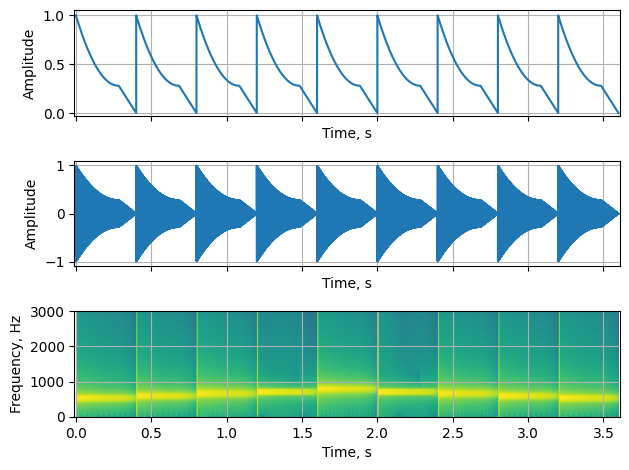

In [34]:
sr = 16_000  

duration = 0.4
num_frames = int(sr * duration)

tones = [
    513.74,  # do
    576.65,  # re
    647.27,  # mi
    685.76,  # fa
    769.74,  # so
    685.76,  # fa
    647.27,  # mi
    576.65,  # re
    513.74,  # do
]

freq = np.concatenate([np.full((num_frames, 1), tone) for tone in tones], axis=0)
amp = adsr_envelope(num_frames=num_frames, attack=0, decay=0.7, sustain=0.28, release=0.29)
amp = np.tile(amp, 9).reshape(-1, 1)

doremi = oscillator_bank(freq, amp, sample_rate=sr)

plot_audio(freq, amp, doremi, sr, volume=0.6)

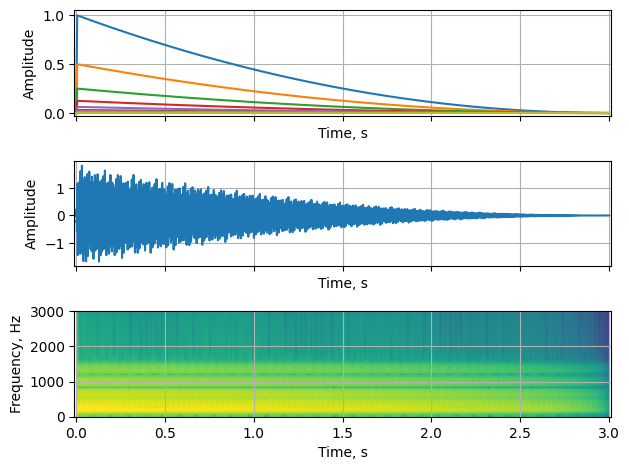

In [35]:
f0 = 344.0  
num_tones = 9
duration = 3.0
num_frames = int(sr * duration)

freq0 = np.full((num_frames, 1), f0)
mults = [0.56, 0.92, 1.19, 1.71, 2, 2.74, 3.0, 3.76, 4.07]
freq = extend_freqs(freq0, mults)

amp = adsr_envelope(
    num_frames=num_frames,
    attack=0.002,
    decay=0.998,
    sustain=0.0,
    release=0.0,
    n_decay=2,
)

amp = np.stack([amp * (0.5**i) for i in range(num_tones)], axis=-1)
waveform = oscillator_bank(freq, amp, sample_rate=sr)

plot_audio(freq, amp, waveform, sr, volume=0.6)

### Задание 2: Синтез на основе физического моделирования (25 баллов)

Синтез на основе физического моделирования — это метод синтеза, который использует алгоритмы цифровой обработки сигналов для создания звуков реальных музыкальных инструментов. При этом звук обычно зависит от 3 различных параметров:

1. **Возбудитель**
2. **Резонансные характеристики инструмента**
3. **Материал, из которого сделан инструмент**
   
Самой популярной версией этого типа синтеза является **алгоритм Карплус-Стронга**.

#### Алгоритм Карплус-Стронга

Алгоритм Карплус-Стронга — это метод синтеза звука, который в основном используется для создания звуков струнных щипковых музыкальных инструментов. Он основан на принципе цифрового волновода, где моделируются отражения волн на концах струны.

Краткое описание работы алгоритма:


1. **Инициализация**: Задаем период повторения $T$ для основной частоты струны и первые $T$ семплов массива `delay_line` заполняем шумом, это имитирует начальный "щипок" струны. Например, если частота `freq = 441 Гц` при частоте дискретизации 44100 Гц, то период составляет 100 семплов, и первые 100 семплов заполняются шумом.

2. **Создание сэмплов**: Каждый последующий сэмпл $y[i]$ рассчитывается как среднее значение двух предыдущих, умноженное на коэффициент затухания `decay`:
   $$
   y[i] = \text{decay} \cdot \frac{y[i-T] + y[i-T-1]}{2}
   $$

Усреднение семплов за один период имитирует отражение энергии вдоль струны. Параметр `decay` — это число от 0 до 1, которое представляет потерю энергии со временем из-за трения.

<center><img src="images/ks.png" width=500></center>

[Оригинальная статья](https://users.soe.ucsc.edu/~karplus/papers/digitar.pdf) и еще [статья](http://sites.music.columbia.edu/cmc/MusicAndComputers/chapter4/04_09.php).

### Задание 2.1: Реализация алгоритма Karplus-Strong (15 баллов)

Реализуйте алгоритм Карплуса-Стронга, заполнив метод `ks_note` в файле `ks_fm.py`. Для инициализации вы можете использовать функцию `np.random.rand(m)`, которая генерирует массив из `m` случайных чисел в диапазоне от `0` до `1`. Эти числа будут использоваться для имитации начального возбуждения струны. Если вы все реализуете правильно, то в результате должны получить такой звуковой сигнал:

In [37]:
%load_ext autoreload
%autoreload 2

sr = 44100
note = -12
duration = 1
decay = 0.98
x = ks_note(sr, note, duration, decay)
ipd.Audio(x, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Задание 2.3: Генератор мелодий (10 баллов)

Теперь давайте создадим универсальный инструмент для генерации мелодий. Для этого заполните функцию `make_melody`, которая будет принимать на вход другую функцию, отвечающую за создание звуков отдельных нот. Назовем эту функцию `note_function`. Функция `note_function` должна уметь генерировать звук для ноты заданной длительности и высоты при определенной частоте дискретизации. Она будет принимать три параметра:

- `sr` - частота дискретизации
- `note` - номер ноты или ее высота
- `duration` - длительность ноты в секундах

Функция должна возвращать массив NumPy, содержащий цифровые значения, представляющие waveform'у для заданной ноты.

Например, вызов:

`x = note_function(44100, 0, 0.1)`

сгенерирует ноту "ля" (A) длительностью 0.1 секунды с частотой дискретизации 44100 Гц.

Удобнее всего реализовать `note_function` с помощью лямбда-функции. Например, если у вас уже есть функция `ks_note`, которая генерирует звук струны, то `note_function` можно определить так:

`note_function = lambda sr, note, duration: ks_note(sr, note, duration, 0.99)`

В функции `make_melody` нужно последовательно вызывать `note_function` для каждой ноты в мелодии и объединять полученные звуковые данные в один общий массив. Для объединения массивов можно использовать функцию `np.concatenate`.

Если значение параметра `note` равно `nan`, то это будет означать паузу. В этом случае вы должны просто генерировать массив нулей нужной длительности.

Если вы все сделали правильно и у вас уже есть функция `ks_note`, то при вызове `make_melody` должен получится следующий результат:

In [38]:
%load_ext autoreload
%autoreload 2

sr = 44100
note_function = lambda sr, note, duration: ks_note(sr, note, duration, 0.99)
y = make_melody("Melodies/missy.txt", 0.18, 44100, note_function)
ipd.Audio(y, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Обратите внимание на использование lambda-функции. Ее можно использовать для фиксации значения затухания и изменения параметра ноты, который передается в функцию `ks_note`. Например, следующий код должен выдавать такой звук:

In [39]:
sr = 44100
note_function = lambda sr, note, duration: ks_note(sr, note-12, duration, 0.92)
y = make_melody("Melodies/missy.txt", 0.18, 44100, note_function)
ipd.Audio(y, rate=sr)

### Задание 3: FM синтез (50 баллов)

Модуляция сигнала — это процесс, при котором создается определенное колебание, чаще всего гармоническое, называемое **несущим**. Затем один из параметров этого колебания изменяется во времени в соответствии с исходным сигналом, который называется **модулирующим**. В результате этого изменения формируется модулированный сигнал, параметры которого изменяются во времени. Модуляция позволяет передавать информацию более эффективно и на большие расстояния и, оказывается, её можно применять и для синтеза музыкальных инструментов.

Вспомним, что обычный гармонический сигнал имеет вид:

$$s(t) = A\sin(2\pi f_0 t +\varphi_0)$$

У него есть 3 параметра:

- **Амплитуда $A$**
- **Частота $f_0$**
- **Начальная фаза $\varphi_0$**

Каждый из них можно связать с модулирующим сигналом, получив таким образом три основных вида модуляции: **амплитудную**, **частотную** и **фазовую**.

Уравнение для **частотно модулированного сигнала** (**Frequency Modulation, FM**) сигнала имеет вид:

$$y(t) = A\sin(2\pi f_c t + I\sin(2\pi f_m t))$$

где

- $f_c$ - центральная или «несущая частота»;
- $f_m$ - частота модуляции;
- $I$ - индекс модуляции, т.е. отношение $\frac{f_m}{f_c}$;
- $A$ - амплитуда сигнала

Подробнее про модуляцию можно прочитать [здесь](https://habr.com/ru/articles/158493/) или [здесь](https://www.geeksforgeeks.org/frequency-modulation/).

Но на самом деле мы можем сделать $A$ и $I$ функциями времени и записать сигнал в виде:

$$y(t)= A(t)\sin(2\pi f_c t + I(t)\sin(2\pi f_m  t))$$

Идею FM синтеза впервые подробно описал `Chowning`. В [своей статье](https://web.eecs.umich.edu/~fessler/course/100/misc/chowning-73-tso.pdf) он показывает, что выбор правильных функций для $A(t)$ и $I(t)$ имеет решающее значение для создания различных звуков музыкальных инструментов. Давайте попробуем воспроизвести некоторые из его идей.

#### Задание 3.1: Реализация FM синтеза (5 баллов)

Реализуйте функцию `fm_note`, которая будет генерировать звук, используя частотную модуляцию. Если вы все сделали, правильно, то используя уже реализованный метод `fm_string_note`, вы должны услышать следующие мелодии:

In [2]:
%load_ext autoreload
%autoreload 2

sr = 44100
note_function = lambda sr, note, duration: fm_string_note(sr, note, duration, 8)
y = make_melody("Melodies/dangerzone.txt", 0.1, 44100, note_function)
ipd.Audio(y, rate=sr)

In [5]:
note_function = lambda sr, note, duration: fm_string_note(sr, note-12, duration, 8)
y = make_melody("Melodies/dangerzone.txt", 0.1, 44100, note_function)
ipd.Audio(y, rate=sr)

#### Задание 3.2: Электрогитара (5 баллов)

Заполните метод `fm_el_guitar_note`, чтобы создать звук, напоминающий электрогитару. Он должен преобразовывать выход функции `fm_string_note` в прямоугольный сигнал. То есть если значение отсчета сигнала больше нуля преобразуйте его в `+1`, если меньше, то в `-1`. Подумайте, как это можно сделать в одну строчку.

In [8]:
%load_ext autoreload
%autoreload 2

sr = 44100
y = make_melody("Melodies/sweetchild.txt", 0.12, 44100, fm_el_guitar_note)
ipd.Audio(y, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Задание 3.3: Колокол (5 баллов)

Заполните метод `fm_bell_note`, чтобы создать ноту, звучащую как удар колокола. Этот метод очень похож на метод `fm_string_note`, но вам нужно взять другие параметры. Используйте экспоненциальную огибающую `exp_env` с $\mu =0.8$ как для амплитуды, так и для огибающей, также возьмите коэффициент частоты модуляции 1,4 для создания негармонических звуков, характерных для колокола и коэффициент модуляции `I`, равный 2. 

Если все работает правильно, вы должны получить следующую мелодию:

In [9]:
%load_ext autoreload
%autoreload 2
    
sr = 44100
y = make_melody("Melodies/westminster.txt", 0.4, 44100, fm_bell_note)
ipd.Audio(y, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Задание 3.4: Духовые инструменты (7 баллов)

Чтобы получить звуки медных духовых инструментов, сначала заполните метод `brass_env`, чтобы сгенерировать огибающую, которая будет использоваться как для амплитуды, так и для индекса модуляции. Огибающая состоит из четырех частей:

`Attack`: 0.1 секунды

`Delay`: следующие 0.1 секунды.

`Sustain`: вся огибающая до затухания.

`Release`: последние 0.1 секунды звука.

Обратите внимание, если параметр длительности меньше 0.3 секунд, то этап `sustain` должен отсутствовать в огибающей. При этом длительности остальных фаз должны быть пропорционально уменьшены.

У вас должна получится следующая картина:

Text(0.5, 1.0, 'Brass Envelope')

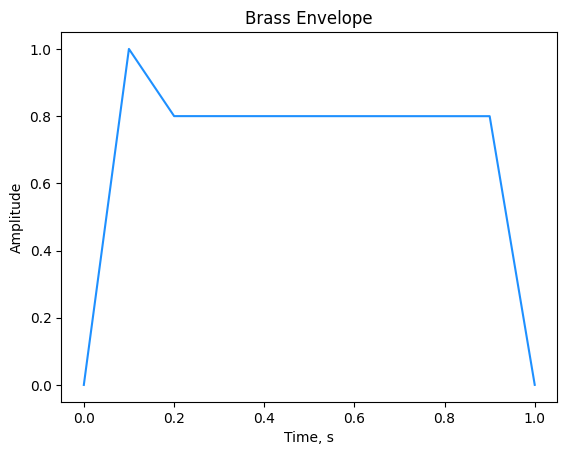

In [9]:
%load_ext autoreload
%autoreload 2

sr = 44100
N = int(sr)
t = np.arange(N)/sr
env = brass_env(N, sr)
plt.plot(t, env, c='dodgerblue')
plt.xlabel("Time, s")
plt.ylabel("Amplitude")
plt.title("Brass Envelope")

Используйте функцию `fm_brass_note` для создания звука духового инструмента. В качестве огибающих используйте `brass_env`. Установите отношение частот `ratio=1` и индекс модуляции `I=10`. 

Если все сделано верно, должен получится следующий звук:

In [10]:
%load_ext autoreload
%autoreload 2
    
sr = 44100
y = make_melody("Melodies/usher.txt", 0.25, 44100, fm_brass_note)
ipd.Audio(y, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
sr = 44100
y = make_melody("Melodies/pictures.txt", 0.15, 44100, fm_brass_note)
ipd.Audio(y, rate=sr)

#### Задание 3.5:  Барабан (8 баллов)

Согласно статье Чоунинга, чтобы создать звук, похожий на барабан, требуется огибающая, которая выглядит так, как показано ниже. Для этого вам нужно заполнить метод `drum_env`.

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Text(0.5, 1.0, 'Drum Envelope')

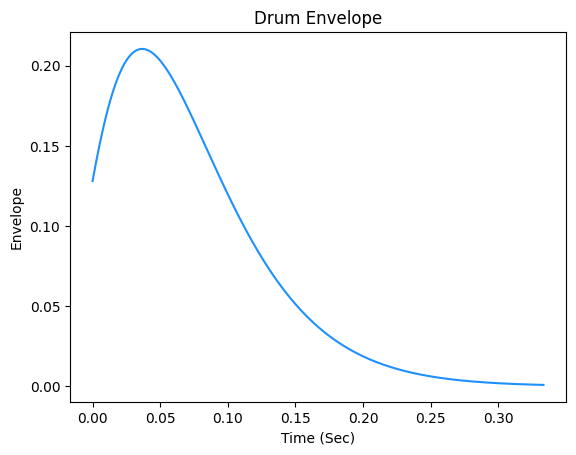

In [41]:
%load_ext autoreload
%autoreload 2
    
sr = 44100
N = int(sr/3)
t = np.arange(N)/sr
env = drum_env(N, sr)
plt.plot(t, env, c='dodgerblue')
plt.xlabel("Time (Sec)")
plt.ylabel("Envelope")
plt.title("Drum Envelope")

В качестве подсказки обратите на сдвинутую по оси $x$ функцию

$$t^2 e^{-\mu t}$$

где $\mu$ — некоторая константа, и чем больше константа, тем быстрее затухание. 

После того, как вы закончите создание огибающей, заполните метод `fm_drum_sound`, чтобы создать звук барабана с помощью метода `drum_env`, используемого как для огибающей, так и для амплитуды. Используйте параметры `ratio=1.4` и `I=2`. 

Также игнорируйте параметр `note`, вместо этого передайте параметр `fix_note` в `fm_note`, чтобы барабан оставался на постоянной высоте.

In [5]:
%load_ext autoreload
%autoreload 2

sr = 44100
y = make_melody("Melodies/3on4.txt", 0.2, 44100, fm_drum_sound)
ipd.Audio(y, rate=sr)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Задание 3.6: Малый барабан (5 баллов)

Это не совсем FM-синтез, но малый барабан можно создать, заполнив массив однородным шумом и умножив его на экспоненциально затухающую огибающую. Для этого заполните метод `snare_drum_sound`. Используйте метод `np.random.rand`, чтобы заполнить все шумом, а затем умножьте на быстро затухающую экспоненциальную огибающую с $\mu = 20$.

Ниже приведен пример:

In [12]:
sr = 44100
y = make_melody("Melodies/3on4.txt", 0.2, 44100, snare_drum_sound)
ipd.Audio(y, rate=sr)

#### Задание 3.7: Деревянный барабан (7 баллов)

Чтобы создать звук деревянного барабана, требуется огибающая, который выглядит так, как показано ниже на рисунке. Для ее создания заполните метод `wood_drum_env`.

Text(0.5, 1.0, 'Wood Drum Envelope')

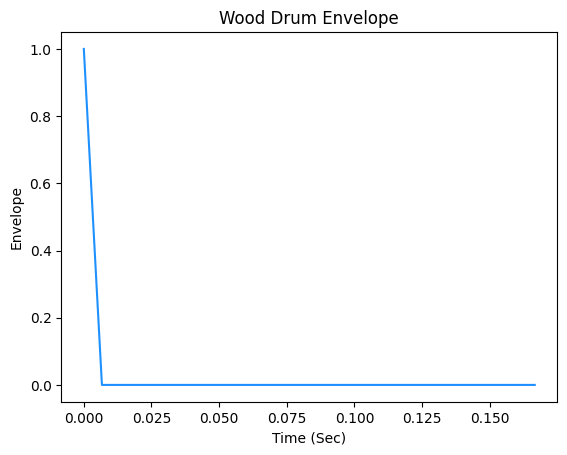

In [13]:
sr = 44100
N = int(sr/6)
t = np.arange(N)/sr
env = wood_drum_env(N, sr)
plt.plot(t, env, c='dodgerblue')
plt.xlabel("Time (Sec)")
plt.ylabel("Envelope")
plt.title("Wood Drum Envelope")

Закончив создание огибающей, заполните метод `fm_wood_drum_sound`, чтобы создать звук деревянного барабана с использованием `wood_drum_env` как для огибающей модуляции, так и для огибающей амплитуды, и коэффициентами `ratio=1.4` и `I=10`. 
Также игнорируйте параметр `note`, вместо этого передайте параметр `fix_note` в `fm_note`, чтобы барабан оставался на постоянной высоте.

In [9]:
sr = 44100
y = make_melody("Melodies/3on4.txt", 0.2, 44100, fm_wood_drum_sound)
ipd.Audio(y, rate=sr)

#### Задание 3.8: Грязный басс (8 баллов)

Фактически, многие инновации, произошедшие с FM-синтезом, появились благодаря тому, что люди придумали свои собственные странные огибающие и схемы модуляции, которые не имеют ничего общего с какой-либо физической мотивацией, но которые звучат действительно круто, как электронная музыка. Попробуйте сделать огибающую `dirty_bass_env`, похожую на представленную ниже:

Text(0.5, 1.0, 'Dirty Bass Envelope')

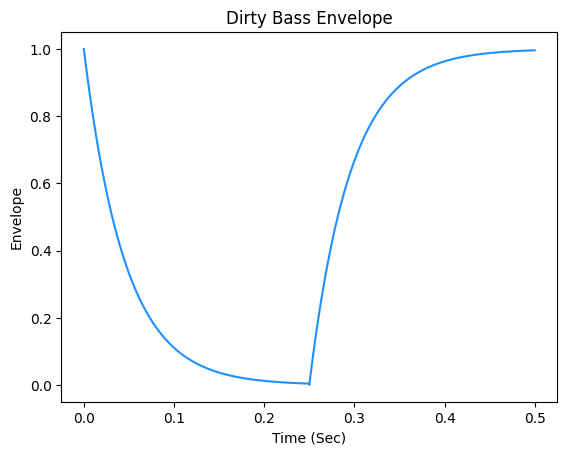

In [14]:
sr = 44100
N = int(sr/2)
t = np.arange(N)/sr
env = dirty_bass_env(N, sr)
plt.plot(t, env, c='dodgerblue')
plt.xlabel("Time (Sec)")
plt.ylabel("Envelope")
plt.title("Dirty Bass Envelope")

Как только вы закончите генерировать огибающую, заполните метод `fm_dirty_bass_note`, используя для огибающих амплитуды и индекса модуляции параметры `ratio=1` и `I=18`.

In [15]:
sr = 44100
y = make_melody("Melodies/dirtybass.txt", 0.25, 44100, fm_dirty_bass_note)
ipd.Audio(y, rate=sr)

### Задание 4: Собственная мелодия (10 баллов)

Поздравляем! Ты только что сделал свой собственный цифровой синтезатор!

Теперь давайте напишем собственную мелодию, используя прошлые наработки.

**Что нужно сделать**: 

- **Напишите мелодию**: дайте волю своей фантазии и сочините любую мелодию, которая вам нравится.
Вы можете использовать предыдущие задания или найти что-нибудь интересное в интернете (не забудьте указать источник). 

- **Добавьте разнообразия**: Чтобы ваша мелодия звучала интереснее, добавьте сразу несколько инструментов. Например, это может быть гитара и барабан.

- **Сохраните свою мелодию**: После того, как вы закончите, сохраните свою мелодию и загрузите её вместе с ноутбуком и файлами `additive.py` и `ks_fm.py`.

- **Поучаствуйте в конкурсе (опционально)**: Вы можете принять участие в конкурсе и выиграть дополнительные баллы.
Для этого вам нужно придумать название вашей мелодии и при сдаче задания написать "Участвую в конкурсе".
Мы вместе с командой курса выберем наиболее понравившиеся мелодии, а победители получат дополнительные баллы.

**🥇 1 место**: + 15 баллов

**🥈 2 место**: + 10 баллов

**🥉 3 место**: + 5 баллов

In [ ]:
# Здесь можно оставить комментарии по дз: